# Process the frames data to compute a pose manifold, and to run classification

In [11]:
import h5py
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
from toolz import compose, curry, partial, valmap
from aging.size_norm.data import clean
from aging.organization.ontogeny import age_map_male
from aging.behavior.scalars import im_moment_features
from scipy.ndimage import gaussian_filter, rotate, shift
from sklearn.decomposition import PCA

In [12]:
version = 7
path = Path(
    f"/n/groups/datta/win/longtogeny/data/ontogeny/version_{version:02d}/all_data_pca/Ontogeny_males"
)

In [13]:
recon_key = f"win_size_norm_frames_v{version - 1}"


def get_uuid(path):
    with h5py.File(path, "r") as h5f:
        return h5f["metadata/uuid"][()].decode()


def check_session(path):
    try:
        return get_uuid(path) not in exclusion_uuids
    except BlockingIOError:
        return False


def has_key(path):
    try:
        with h5py.File(path, "r") as h5f:
            return recon_key in h5f.keys()
    except BlockingIOError:
        return False


def multi_filter(*filters, seq):
    return compose(*(curry(filter)(f) for f in filters))(seq)

In [14]:
session_exclusion_list = "/n/groups/datta/win/longtogeny/data/metadata/Ontogeny experiment list - Session quality control.csv"
exclusion_df = pd.read_csv(session_exclusion_list, header=0)
exclusion_df["Keep?"] = exclusion_df["Keep?"].str.lower()
exclusions = exclusion_df.query('`Keep?` != "y"')

In [15]:
exclusion_uuids = list(map(get_uuid, exclusions["File path"].values))
exclusion_uuids.append('b365ea6a-369f-4991-b139-15694dc1c86d')
exclusion_uuids.append('a85e0616-6a5b-4dd8-a2d6-51701084c25e')
files = sorted(multi_filter(has_key, check_session, seq=path.glob("*.h5")))

In [16]:
files[0].resolve().parents[2].name

'3months_19042021'

In [17]:
sessions_df = []
for f in tqdm(files):
    with h5py.File(f, "r") as h5f:
        sessions_df.append(
            dict(
                area=np.median(h5f["scalars/area_px"]),
                session=h5f["metadata/acquisition/SessionName"][()].decode(),
                subject=h5f["metadata/acquisition/SubjectName"][()].decode(),
                uuid=h5f["metadata/uuid"][()].decode(),
                file=str(f),
                age=f.resolve().parents[2].name
            )
        )

sessions_df = pd.DataFrame(sessions_df)
sessions_df["age"] = sessions_df["age"].map(age_map_male).astype("int")
sessions_df = sessions_df.dropna()
sessions_df = sessions_df[~sessions_df["session"].str.contains("CRL")]

  0%|          | 0/351 [00:00<?, ?it/s]

In [18]:
super_clean = partial(clean, height_thresh=14, tail_ksize=7, dilation_ksize=4)


def alignment_function(frame, recon_frame):
    frame = super_clean(frame)
    filt_frame = gaussian_filter(frame.astype("float32"), 13)
    filt_recon_frame = gaussian_filter(recon_frame.astype("float32"), 13)

    raw_peak = np.array(np.unravel_index(np.argmax(filt_frame), filt_frame.shape))
    recon_peak = np.array(
        np.unravel_index(np.argmax(filt_recon_frame), filt_recon_frame.shape)
    )

    translated = shift(frame, recon_peak - raw_peak)

    moments = im_moment_features(translated)
    if moments is None:
        return frame
    rotated = rotate(
        translated, -np.rad2deg(moments["orientation"]), reshape=False
    ).astype("uint8")
    # rotated2 = np.rot90(rotated, 2)
    # mse = np.mean((rotated - recon_frame) ** 2)
    # mse2 = np.mean((rotated2 - recon_frame) ** 2)
    # return min({mse: rotated, mse2: rotated2}.items(), key=lambda x: x[0])[1]
    return rotated

In [19]:
selected = sessions_df.groupby('age').sample(n=11, random_state=0)

In [ ]:
n_frames = 9_000

all_frames = {}
all_recon_frames = {}
for idx, (_idx, row) in enumerate(
    tqdm(selected.sort_values(by="uuid").iterrows(), total=len(selected))
):
    with h5py.File(row.file, "r") as h5f:
        recon_frames = h5f[recon_key][:n_frames].astype("uint8")
        all_frames[(idx, row.uuid, row.file, row.age)] = np.array(
            [
                alignment_function(f, r)
                for f, r in zip(h5f["frames"][:n_frames], recon_frames)
            ]
        )
        all_recon_frames[(idx, row.uuid, row.file, row.age)] = recon_frames
    if idx % 6 == 0:
        joblib.dump(
            dict(frames=all_frames, recon=all_recon_frames),
            f"/n/scratch3/users/w/wg41/aging-aligned-frames_version{version:02d}.p",
            # "/n/scratch3/users/w/wg41/aging-aligned-frames-with-flip-correction.p",
        )

  0%|          | 0/198 [00:00<?, ?it/s]

## K-Means cluster pose

In [20]:
from sklearn.cluster import k_means

In [21]:
def flatten(x):
    return x.reshape(len(x), -1)


def subsample(data, subset=200, seed=0):
    np.random.seed(seed)
    sample = []
    for k, v in data.items():
        sample.append(v[np.random.permutation(np.arange(len(v)))[:subset]])
    return np.concatenate(sample, axis=0)


def multi_stage_pca(data, subset_frames=200, total_frames=7000, seed=0):
    np.random.seed(seed)

    train = []
    for k, v in data.items():
        train.append(v[np.random.permutation(np.arange(len(v)))[:subset_frames]])
    train = np.concatenate(train, axis=0)

    pca = PCA(n_components=10).fit(train.reshape(len(train), -1))

    pcs = valmap(
        compose(
            pca.transform,
            flatten,
            lambda v: v[np.random.permutation(np.arange(len(v)))[:total_frames]],
        ),
        data,
    )
    return pcs

In [22]:
data = joblib.load(f"/n/scratch3/users/w/wg41/aging-aligned-frames_version{version:02d}.p")

In [23]:
all_recon_frames = data['recon']

In [24]:
pcs = multi_stage_pca(all_recon_frames, total_frames=10_000, subset_frames=500)

In [37]:
centroid, labels, inertia = k_means(
    np.concatenate(list(pcs.values()), axis=0), n_clusters=14, random_state=0
)

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [38]:
unbatched_labels = {}
idx = 0
for k, v in pcs.items():
    unbatched_labels[k] = labels[idx:len(v)+idx]
    idx += len(v)

In [39]:
label_df = []
for k, v in unbatched_labels.items():
    label_df.append(pd.DataFrame(dict(age=k[-1], uuid=k[1], label=v)))
label_df = pd.concat(label_df).reset_index()

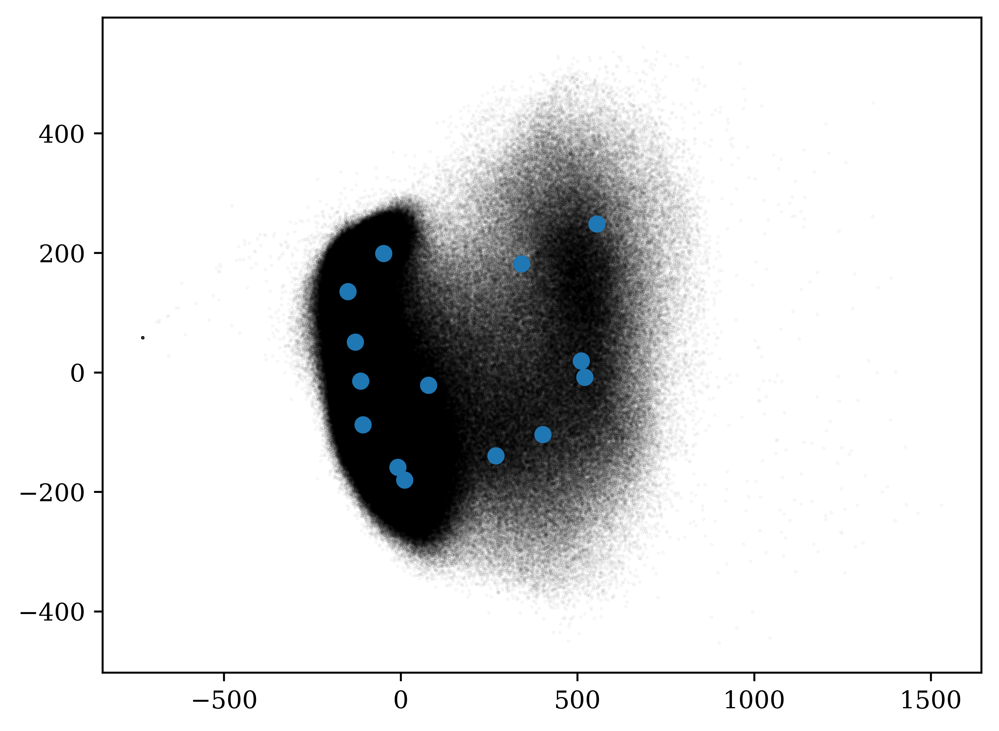

In [40]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, :2].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, :2].T)

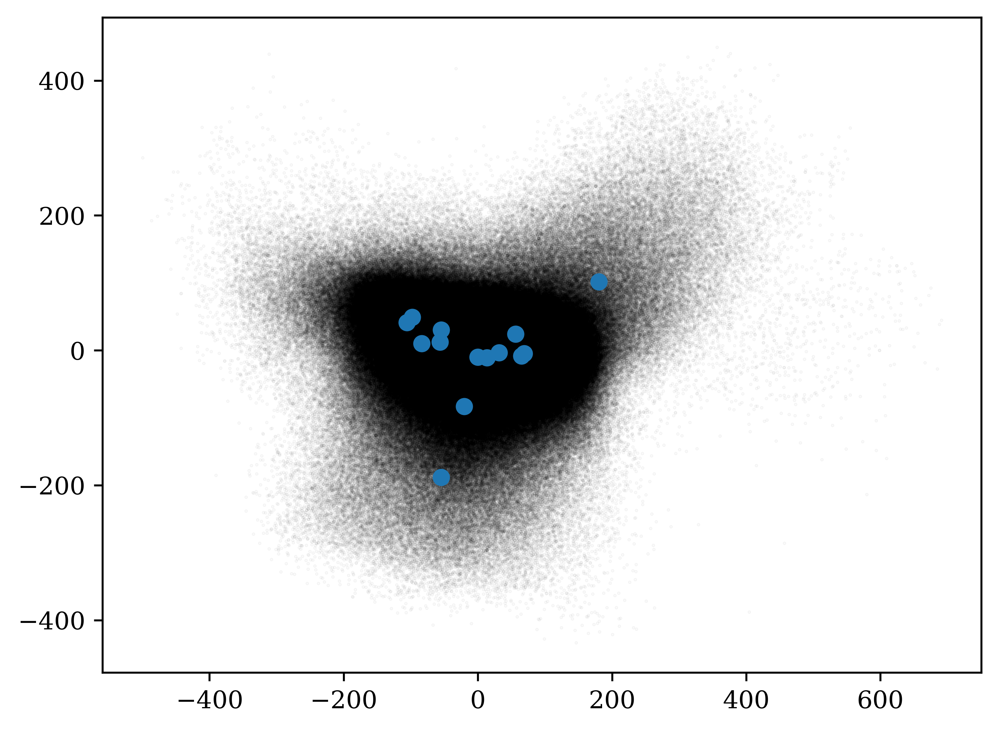

In [41]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 2:4].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 2:4].T)

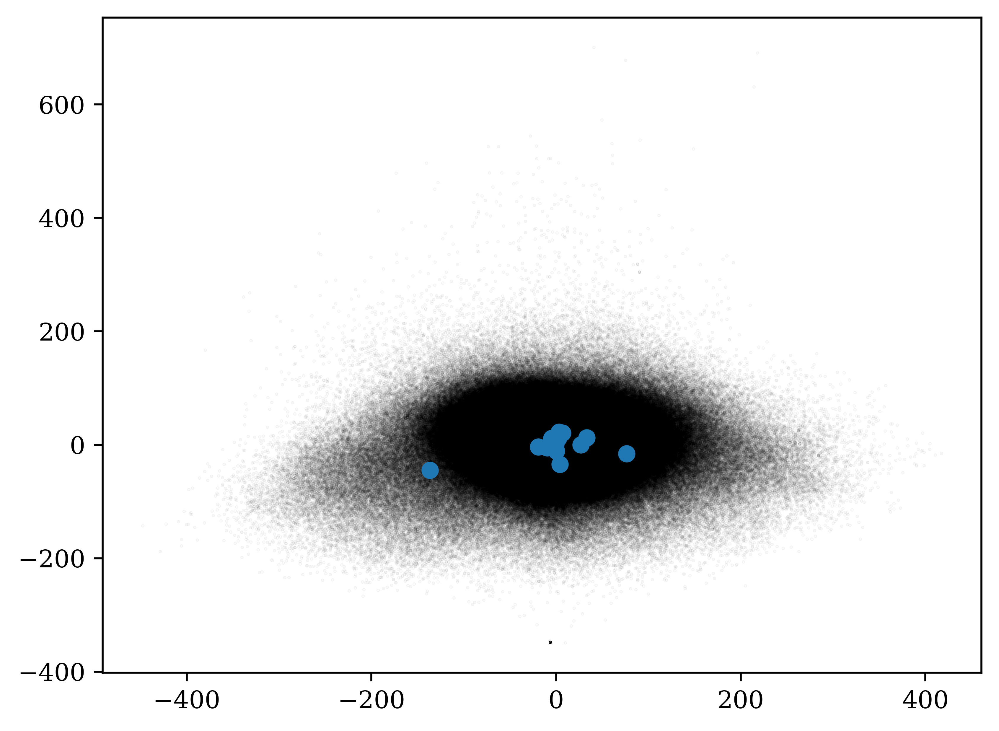

In [42]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 4:6].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 4:6].T)

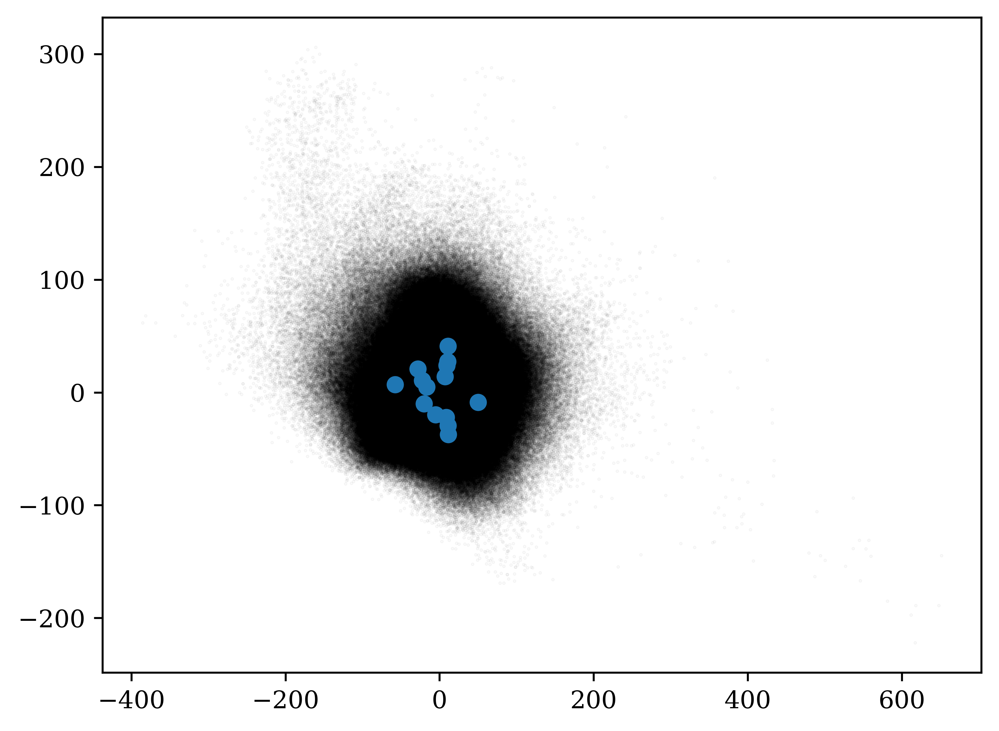

In [43]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 6:8].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 6:8].T)

In [44]:
pose_freqs =  pd.pivot(label_df.groupby('age')['label'].value_counts().reset_index(), index='age', columns='label')

In [45]:
pose_freqs

count                                                                   \
label     0     1     2      3      4      5     6     7      8      9     10   
age                                                                             
3       8911  1917   944   5039   7334  15568  1040  1226   7170   7470  7638   
5      10313  2815  2029   7058   4916  14938  1579  1999   9134   8058  6908   
7       7268  2344  2502   7468   4564  19027  1880  3516   8821  11708  6787   
9       9605  2654  2536   9201   3912  14348  2439  3381   7217   9639  6228   
12      9173  3522  3123   9279   4356  14780  3359  2954   9295  10564  3356   
16     13831  4034  2742  11319   4240  10998  4236  3540  10469   8814  1502   
20     13217  3934  2775   9931   5287  13566  2161  3346  11520  10603  1499   
24      7195  2319  3220  12124   6963  12845  3307  3607   4600  16028  1511   
28     12203  2513  2493   9855   3998  10998  3635  3148  11362   9199  1421   
32     14915  2248  1511   5564   6949  12746  1480  2614  16645   7410  1592   
36     13687  2077  1928   5534   9247  13463  1580  2394  11204   8990  1930   
52     10507  2223  2537   7029   9199  15714  1910  3205  12270  12013  1591   
56     16796  1498  1511   6210   6156  13499  1832  2416  21938   8414   794   
72     17289  1347  2256   5971   5814  13490  1631  2432  20787   9386   654   
78     14319  1796  3317   5457   5355  13474   492  3314  15019   7097  1538   
80     16374  1968  2303   5800   5716  14331  1100  2782  21060   9478   689   
84     15424  1868  2784   6535   5494  12702  1818  2745  23275   9997   560   
91     18283  1075  1935   2289  10050  16073  1218  1881  26269   5632  1386   

                           
label    11     12     13  
age                        
3       601  13192  11950  
5       793  20971   7489  
7      2534  14706   5875  
9      2216  19727   5897  
12     3065  15989   6185  
16     3779  13018   6478  
20     3622  12674   4865  
24     3787  16081   5413  
28     2173  11592   5410  
32     2013  10338   3975  
36     2020  10324   5622  
52     4319  11017   5466  
56     2353  10270   5313  
72     2928   8572   6443  
78     4856   9759   4207  
80     3599   8668   5132  
84     3517   6949   5332  
91     2315   5335   5259

<Axes: xlabel='None-label', ylabel='None-label'>

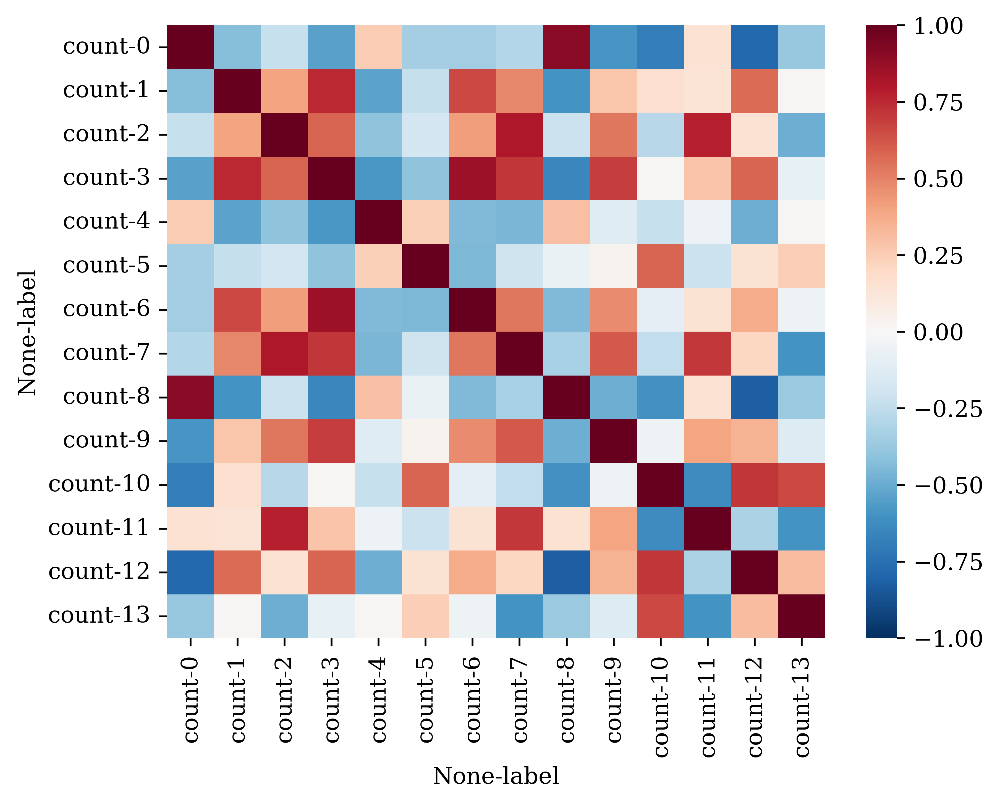

In [46]:
sns.heatmap(pose_freqs.corr(), cmap='RdBu_r', vmin=-1)

<Axes: xlabel='age'>

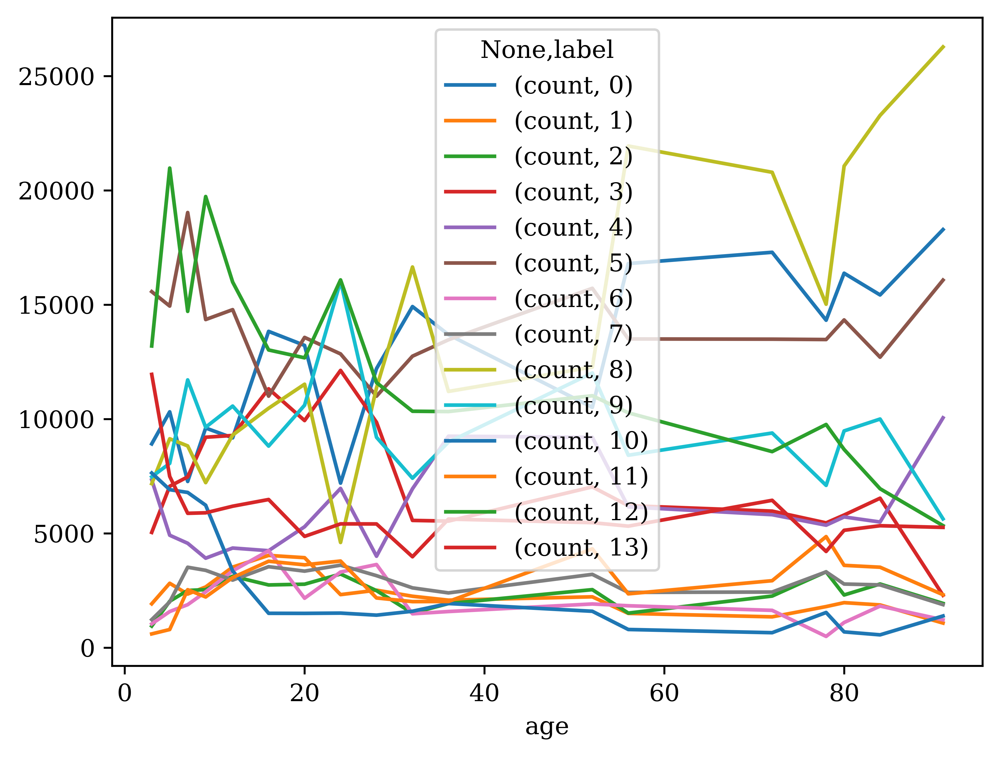

In [47]:
pose_freqs.plot()

In [48]:
pose_freqs.min(axis=1)

age
3      601
5      793
7     1880
9     2216
12    2954
16    1502
20    1499
24    1511
28    1421
32    1480
36    1580
52    1591
56     794
72     654
78     492
80     689
84     560
91    1075
dtype: int64

In [51]:
pose_freqs.min(axis=1).min()

492

In [52]:
min_samples = 490

In [55]:
sample = label_df.groupby(['age', 'label'], sort=False).sample(n=min_samples, random_state=0)
sample = sample.sort_values(['age', 'uuid', 'index']).set_index(['age', 'uuid'])

In [56]:
sample 

index  label
age uuid                                              
3   0514b112-c12c-4785-84bd-93a8b40235e9      3      2
    0514b112-c12c-4785-84bd-93a8b40235e9     17      4
    0514b112-c12c-4785-84bd-93a8b40235e9     38     11
    0514b112-c12c-4785-84bd-93a8b40235e9     52      2
    0514b112-c12c-4785-84bd-93a8b40235e9     75     12
...                                         ...    ...
91  e272b7f4-3fe2-4fba-8ae9-0b1f8da43f69   8938      8
    e272b7f4-3fe2-4fba-8ae9-0b1f8da43f69   8958      5
    e272b7f4-3fe2-4fba-8ae9-0b1f8da43f69   8970      8
    e272b7f4-3fe2-4fba-8ae9-0b1f8da43f69   8987      9
    e272b7f4-3fe2-4fba-8ae9-0b1f8da43f69   8989     12

[123480 rows x 2 columns]

In [57]:
pose_samples_recon = {}
pose_samples = {}
for k, v in data['recon'].items():
    tmp = sample.loc[(k[-1], k[1])]
    pose_samples_recon[k] = v[tmp['index'].to_numpy()]
    pose_samples[k] = data['frames'][k][tmp['index'].to_numpy()]

In [58]:
joblib.dump(
    dict(frames=pose_samples, recon=pose_samples_recon),
    f"/n/scratch3/users/w/wg41/aging-aligned-frames-pose-resampled_version{version:02d}.p",
    compress=1
)

['/n/scratch3/users/w/wg41/aging-aligned-frames-pose-resampled_version07.p']